# Region Displayer
___

This Jupyter Notebook is part of the time travel distance project and displays the travel time and elevation data, which got aquired in a previous step. Be sure to run the RegionMapper before running this notebook to collect needed data. In this notebook we will load the data, display the samples, create the interpolation maps for each transportation type (walking, bicycling, driving) and elevation and lastly display the difference between the transportation types travel time. 


### Import

In [3]:
from RegionElevatioDisplayer.regionElevationDisplayer import RegionElevationDisplayer
from RegionTimeDistanceDisplayer.regionTimeDistanceDisplayer import RegionTimeDistanceDisplayer

### Load
Load data from JSON files stored in the data directory for different modes of transportation. Transportation modes which are stored are bicycling, walking and driving. Additonally we load the elevation data which can also be found in the data directory. 

In [127]:
# Load Walking Object
rtddWalking = RegionTimeDistanceDisplayer(filename="/data/walking.json")

# Load Bicycling Object
rtddBicycling = RegionTimeDistanceDisplayer(filename="/data/bicycling.json")

# Load Driving Object
rtddDriving = RegionTimeDistanceDisplayer(filename="/data/driving.json")

# Load Elevation Object
elevation = RegionElevationDisplayer()
print(len(elevation.coords))

2573


### Display Samples
The datapoints where collected in a grid fashion (for more information see tha RegionMapper notebook).We display the samples of collected data with a Folium map and show the travel time and elevation height. For the different transportation modes samples will display the travel time from the big marker in the center to the sample point, where blue means short and pink means long. For the elevation map we encode the height as color of the samples, where blue means low and pink means high. Additionally you can click on each data point to see the travel time or height.

⚠️ Be carefull if you render all maps, since there are quite a lot of data points this might slow down your computer.

#### Walking Samples

In [3]:
rtddWalking.generateMap()
rtddWalking.map

#### Bicycling Samples

In [4]:
rtddBicycling.generateMap()
rtddBicycling.map

#### Driving Samples

In [16]:
rtddDriving.generateMap()
rtddDriving.map

#### Elevation Samples

In [6]:
elevation.generateMap()
elevation.map

### Display Interpolation Maps
In order to compare the maps we need an interpolated version of the maps 

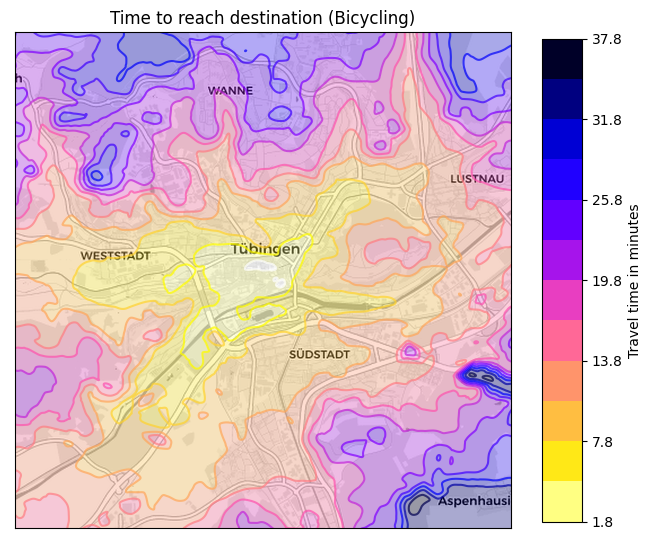

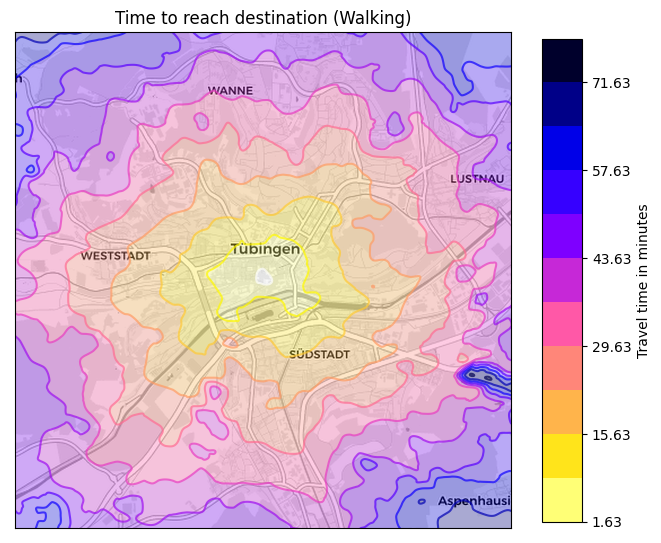

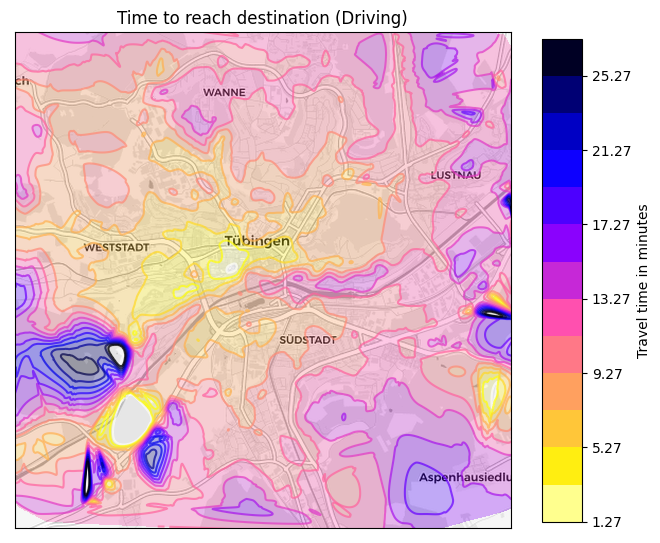

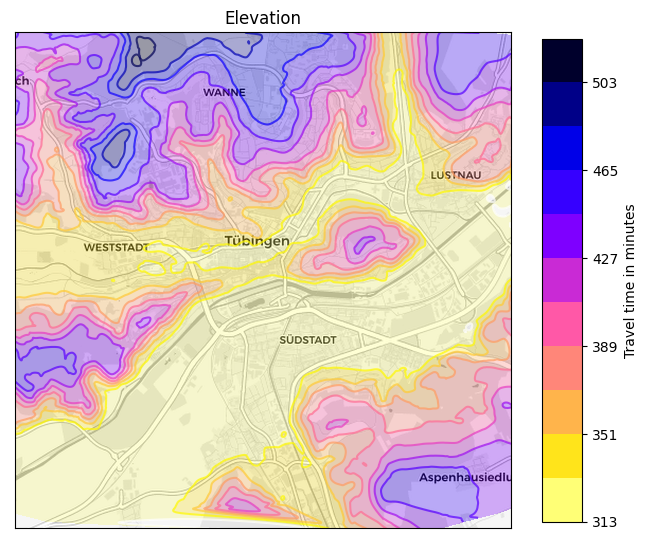

In [129]:
import math
import tilemapbase
import numpy as np
import matplotlib.tri as tri
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from PIL import ImageOps


def generateInterpolationPlot(coords, values, title):


    fig, ax = plt.subplots( figsize=(8, 8), dpi=100)
    ax.set_title(title)

    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

    # Split coords
    lats = np.array(coords)[:,0]
    lons = np.array(coords)[:,1]

    # Build tilemap 
    # tm = tilemapbase.tiles.build_OSM()
    tm = tilemapbase.tiles.Carto_Light
    dx = 0.001
    dy = 0.001
    extent = tilemapbase.Extent.from_lonlat(lons.min() + dx, lons.max() - dx, lats.min() + dy, lats.max() - dy)
    extent = extent.to_aspect(1.0)
    plotter = tilemapbase.Plotter(extent, tm,  zoom=13)
    

    # Project Coords
    pCoords = []
    for coord in coords:
        x, y = tilemapbase.project(coord[1], coord[0])
        pCoords.append((x, y))

    pLats = np.array(pCoords)[:,0]
    pLons = np.array(pCoords)[:,1]


    # Plot Interpolate points
    grid_x, grid_y = np.mgrid[pLats.min():pLats.max():1000j, pLons.min():pLons.max():1000j]
    grid = griddata(pCoords, values, (grid_x, grid_y), method='cubic', )
    # plt.imshow(grid.T, origin='lower', alpha=0.8, extent=(pLats.min(),pLats.max(),pLons.min(),pLons.max()), cmap='plasma')

    # Show the contours.
    dmax = np.array(values).max()
    # dmax = 70
    step = math.floor(dmax   / 10.)
    levels = np.arange(0, dmax + step, step ) 
    contours = ax.contourf(grid_x, grid_y, grid, levels=levels, alpha=1, cmap="gnuplot2_r") 
    cbar = plt.colorbar(contours, shrink=0.8, aspect=12)
    cbar.ax.set_ylabel('Travel time in minutes')
    
    # plotter.plot(ax, tm, alpha=0.5, zorder = 1)
    # Plotting 
    tile = plotter.as_one_image(False)
    scale = 2 ** plotter.zoom
    x0, y0 = plotter.extent.project(plotter.xtilemin / scale, plotter.ytilemin / scale)
    x1, y1 = plotter.extent.project((plotter.xtilemax + 1) / scale, (plotter.ytilemax + 1) / scale)
    tile = ImageOps.grayscale(tile)
    ax.imshow(tile, interpolation="lanczos", extent=(x0,x1,y1,y0), zorder = 2, alpha=0.7, cmap='gray')
    ax.set(xlim = plotter.extent.xrange, ylim = plotter.extent.yrange) 
    contours = ax.contour(grid_x, grid_y, grid, levels=levels, alpha=0.7, cmap="gnuplot2_r") 


    
    # Plot points 
    # ax.scatter(pLats, pLons, c=durations, marker=".", cmap="magma_r", linewidth=0.0001, alpha=0.6)

 

values = []
for duration in rtddBicycling.durations:
    values.append(duration / 60)

generateInterpolationPlot(rtddBicycling.coords, values, title="Time to reach destination (Bicycling)")

values = []
for duration in rtddWalking.durations:
    values.append(duration / 60)

generateInterpolationPlot(rtddWalking.coords, values, title="Time to reach destination (Walking)")

values = []
for duration in rtddDriving.durations:
    values.append(duration / 60)

generateInterpolationPlot(rtddDriving.coords, values, title="Time to reach destination (Driving)")


generateInterpolationPlot(elevation.coords, elevation.elevations, title="Elevation")


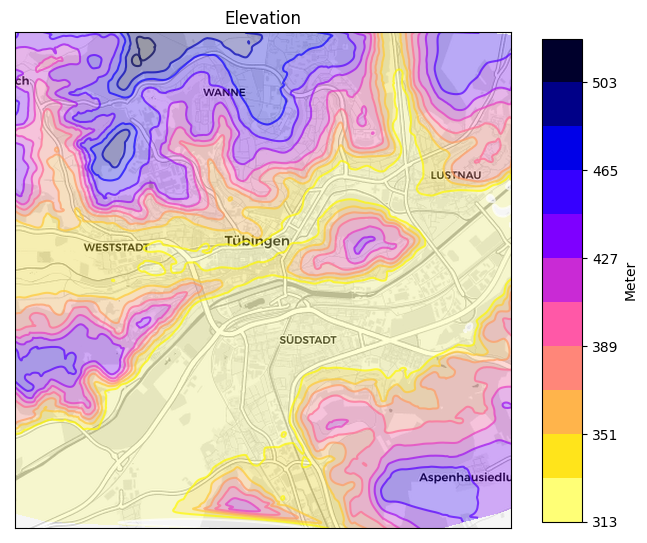

In [130]:
import math
import tilemapbase
import numpy as np
import matplotlib.tri as tri
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from PIL import ImageOps


def generateInterpolationPlot(coords, values, title):


    fig, ax = plt.subplots( figsize=(8, 8), dpi=100)
    ax.set_title(title)

    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

    # Split coords
    lats = np.array(coords)[:,0]
    lons = np.array(coords)[:,1]

    # Build tilemap 
    # tm = tilemapbase.tiles.build_OSM()
    tm = tilemapbase.tiles.Carto_Light
    dx = 0.001
    dy = 0.001
    extent = tilemapbase.Extent.from_lonlat(lons.min() + dx, lons.max() - dx, lats.min() + dy, lats.max() - dy)
    extent = extent.to_aspect(1.0)
    plotter = tilemapbase.Plotter(extent, tm,  zoom=13)
    

    # Project Coords
    pCoords = []
    for coord in coords:
        x, y = tilemapbase.project(coord[1], coord[0])
        pCoords.append((x, y))

    pLats = np.array(pCoords)[:,0]
    pLons = np.array(pCoords)[:,1]


    # Plot Interpolate points
    grid_x, grid_y = np.mgrid[pLats.min():pLats.max():1000j, pLons.min():pLons.max():1000j]
    grid = griddata(pCoords, values, (grid_x, grid_y), method='cubic', )
    # plt.imshow(grid.T, origin='lower', alpha=0.8, extent=(pLats.min(),pLats.max(),pLons.min(),pLons.max()), cmap='plasma')

    # Show the contours.
    dmax = np.array(values).max()
    dmin = np.array(values).min()
    # dmax = 70
    step = math.floor((dmax - dmin)  / 10.)
    levels = np.arange(dmin, dmax + step, step ) 
    contours = ax.contourf(grid_x, grid_y, grid, levels=levels, alpha=1, cmap="gnuplot2_r") 
    cbar = plt.colorbar(contours, shrink=0.8, aspect=12)
    cbar.ax.set_ylabel('Meter')
    
    # plotter.plot(ax, tm, alpha=0.5, zorder = 1)
    # Plotting 
    tile = plotter.as_one_image(False)
    scale = 2 ** plotter.zoom
    x0, y0 = plotter.extent.project(plotter.xtilemin / scale, plotter.ytilemin / scale)
    x1, y1 = plotter.extent.project((plotter.xtilemax + 1) / scale, (plotter.ytilemax + 1) / scale)
    tile = ImageOps.grayscale(tile)
    ax.imshow(tile, interpolation="lanczos", extent=(x0,x1,y1,y0), zorder = 2, alpha=0.7, cmap='gray')
    ax.set(xlim = plotter.extent.xrange, ylim = plotter.extent.yrange) 
    contours = ax.contour(grid_x, grid_y, grid, levels=levels, alpha=0.7, cmap="gnuplot2_r") 


    
    # Plot points 
    # ax.scatter(pLats, pLons, c=durations, marker=".", cmap="magma_r", linewidth=0.0001, alpha=0.6)



generateInterpolationPlot(elevation.coords, elevation.elevations, title="Elevation")


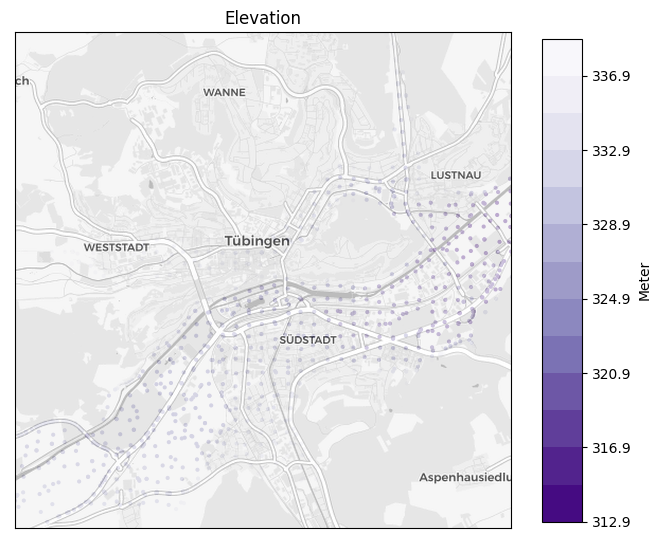

In [139]:
import math
import tilemapbase
import numpy as np
import matplotlib.tri as tri
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from PIL import ImageOps


# Relative Elevation Map 
rathausElv = 337.0936584472656

def generateInterpolationPlot(coords, values, title):


    fig, ax = plt.subplots( figsize=(8, 8), dpi=100)
    ax.set_title(title)

    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

    # Split coords
    lats = np.array(coords)[:,0]
    lons = np.array(coords)[:,1]

    # Build tilemap 
    # tm = tilemapbase.tiles.build_OSM()
    tm = tilemapbase.tiles.Carto_Light
    dx = 0.001
    dy = 0.001
    extent = tilemapbase.Extent.from_lonlat(lons.min() + dx, lons.max() - dx, lats.min() + dy, lats.max() - dy)
    extent = extent.to_aspect(1.0)
    plotter = tilemapbase.Plotter(extent, tm,  zoom=13)
    

    # Project Coords
    pCoordsLowCoords = []
    pCoordsLowElevation = []
    pCoordsHighCoords = []
    pCoordsHighElevation = []
    for i in range(len(coords)):
        coord = coords[i]
        elevation = values[i]
        x, y = tilemapbase.project(coord[1], coord[0])

        if elevation < rathausElv:
            pCoordsLowCoords.append((x,y))
            pCoordsLowElevation.append(elevation)
        else:
            pCoordsHighCoords.append((x,y))
            pCoordsHighElevation.append(elevation)

        x, y = tilemapbase.project(coord[1], coord[0])


    pLatsLow = np.array(pCoordsLowCoords)[:,0]
    pLonsLow = np.array(pCoordsLowCoords)[:,1]

    pLatsHigh = np.array(pCoordsHighCoords)[:,0]
    pLonsHigh = np.array(pCoordsHighCoords)[:,1]

    # Plot Interpolate points
    grid_xLow, grid_yLow = np.mgrid[pLatsLow.min():pLonsLow.max():1000j, pLatsLow.min():pLonsLow.max():1000j]
    gridLow = griddata(pCoordsLowCoords, pCoordsLowElevation, (grid_xLow, grid_yLow), method='cubic', )
    # plt.imshow(grid.T, origin='lower', alpha=0.8, extent=(pLats.min(),pLats.max(),pLons.min(),pLons.max()), cmap='plasma')



    # Show the contours.
    #1 
    dmax = np.array(pCoordsLowElevation).max()
    dmin = np.array(pCoordsLowElevation).min()
    # dmax = 70
    step = math.floor((dmax - dmin)  / 10.)
    levels = np.arange(dmin, dmax + step, step ) 
    contours = ax.contourf(grid_xLow, grid_yLow, gridLow, levels=levels, alpha=1, cmap="Purples_r") 
    cbar = plt.colorbar(contours, shrink=0.8, aspect=12)
    cbar.ax.set_ylabel('Meter')

    #2



    
    # plotter.plot(ax, tm, alpha=0.5, zorder = 1)
    # Plotting 
    tile = plotter.as_one_image(False)
    scale = 2 ** plotter.zoom
    x0, y0 = plotter.extent.project(plotter.xtilemin / scale, plotter.ytilemin / scale)
    x1, y1 = plotter.extent.project((plotter.xtilemax + 1) / scale, (plotter.ytilemax + 1) / scale)
    tile = ImageOps.grayscale(tile)
    ax.imshow(tile, interpolation="lanczos", extent=(x0,x1,y1,y0), zorder = 2, alpha=0.7, cmap='gray')
    ax.set(xlim = plotter.extent.xrange, ylim = plotter.extent.yrange) 
    contours = ax.contour(grid_xLow, grid_yLow, gridLow, levels=levels, alpha=0.7, cmap="Purples") 


    
    # Plot points 
    ax.scatter(pLatsLow, pLonsLow, c=pCoordsLowElevation, marker=".", cmap="Purples_r", linewidth=0.0001, alpha=1)



generateInterpolationPlot(elevation.coords, elevation.elevations, title="Elevation")